In [1]:
from utils.tiff_to_numpy import load_SARFishProduct, load_SentinelProduct
from pathlib import Path
from osgeo import gdal, gdal_array
import matplotlib.pyplot as plt
import numpy as np

In [121]:
swath_index = 1

snap_path = '/mnt/sasa028/cvnn4sar/SARFish/SNAP_data/raw_data/SLC/detection'
sarfish_path = '/mnt/sasa028/cvnn4sar/SARFish/SARFish_data/raw_data/SLC/detection'

products = ['S1A_IW_SLC__1SDV_20200126T175310_20200126T175337_030975_038E94_D249', 'S1A_IW_SLC__1SDV_20200214T174430_20200214T174457_031252_03982E_1D44', 'S1A_IW_SLC__1SDV_20200126T052956_20200126T053026_030967_038E50_4681', 'S1A_IW_SLC__1SDV_20200226T052146_20200226T052216_031419_039DEC_1B76', 'S1A_IW_SLC__1SDV_20200321T174430_20200321T174457_031777_03AA65_97CA', 'S1A_IW_SLC__1SDV_20200403T054834_20200403T054901_031959_03B0CA_FD46', 'S1A_IW_SLC__1SDV_20200407T052956_20200407T053026_032017_03B2E2_18FA', 'S1A_IW_SLC__1SDV_20200414T174431_20200414T174458_032127_03B6BD_BBB0', 'S1A_IW_SLC__1SDV_20200421T050338_20200421T050406_032221_03BA14_7DD2', 'S1A_IW_SLC__1SDV_20200427T054835_20200427T054902_032309_03BD1A_0BE5', 'S1A_IW_SLC__1SDV_20200427T054900_20200427T054928_032309_03BD1A_6DE0', 'S1A_IW_SLC__1SDV_20200501T051926_20200501T051953_032367_03BF2F_45CD', 'S1A_IW_SLC__1SDV_20200503T051344_20200503T051413_032396_03C03F_CD9E', 'S1A_IW_SLC__1SDV_20200520T051115_20200520T051142_032644_03C7E8_E2BE', 'S1A_IW_SLC__1SDV_20200522T050603_20200522T050631_032673_03C8C7_E420', 'S1A_IW_SLC__1SDV_20200613T051117_20200613T051144_032994_03D25F_B3C5', 'S1A_IW_SLC__1SDV_20200618T051929_20200618T051956_033067_03D4A2_167D', 'validation_zipped', 'S1A_IW_SLC__1SDV_20200724T053002_20200724T053032_033592_03E4A8_F5D5', 'S1A_IW_SLC__1SDV_20200731T051120_20200731T051147_033694_03E7BB_2AC0', 'S1A_IW_SLC__1SDV_20200807T050319_20200807T050346_033796_03EB07_85FB', 'S1A_IW_SLC__1SDV_20200824T052155_20200824T052225_034044_03F3B6_EA99', 'S1A_IW_SLC__1SDV_20200831T051418_20200831T051446_034146_03F756_2E58', 'S1A_IW_SLC__1SDV_20200904T171758_20200904T171831_034212_03F991_8544', 'S1A_IW_SLC__1SDV_20200907T050725_20200907T050752_034248_03FAD3_1672', 'S1A_IW_SLC__1SDV_20200910T053004_20200910T053034_034292_03FC65_1F7A', 'S1A_IW_SLC__1SDV_20200928T171759_20200928T171831_034562_0405EA_2228', 'S1A_IW_SLC__1SDV_20201121T175319_20201121T175346_035350_04214D_710B', 'S1B_IW_SLC__1SDV_20200221T054744_20200221T054811_020363_026919_0E4E', 'S1A_IW_SLC__1SDV_20200630T053000_20200630T053030_033242_03D9F7_9D63', 'S1A_IW_SLC__1SDV_20200706T074222_20200706T074242_033331_03DC92_2526', 'S1B_IW_SLC__1SDV_20200402T170911_20200402T170938_020968_027C5A_2EF6', 'S1B_IW_SLC__1SDV_20200511T062006_20200511T062033_021530_028E04_7727', 'S1B_IW_SLC__1SDV_20200514T051033_20200514T051100_021573_028F48_FFD5', 'S1B_IW_SLC__1SDV_20200527T054812_20200527T054838_021763_0294E5_89D9', 'S1B_IW_SLC__1SDV_20200615T054003_20200615T054030_022040_029D41_DDDC', 'S1B_IW_SLC__1SDV_20200620T165737_20200620T165804_022120_029FAC_BB0B', 'S1B_IW_SLC__1SDV_20200719T055553_20200719T055620_022536_02AC5E_ABAE', 'S1B_IW_SLC__1SDV_20200726T165739_20200726T165806_022645_02AFAD_6A9B', 'S1B_IW_SLC__1SDV_20200803T075720_20200803T075748_022756_02B2FF_E5D2', 'S1B_IW_SLC__1SDV_20200807T054751_20200807T054818_022813_02B4C5_01F5', 'S1B_IW_SLC__1SDV_20200807T054816_20200807T054843_022813_02B4C5_5575', 'S1B_IW_SLC__1SDV_20200823T051851_20200823T051918_023046_02BC20_FDFA', 'S1B_IW_SLC__1SDV_20200826T054007_20200826T054034_023090_02BD74_03D2', 'S1B_IW_SLC__1SDV_20200831T054752_20200831T054819_023163_02BFB2_13D6', 'S1B_IW_SLC__1SDV_20200905T055556_20200905T055623_023236_02C208_B2C6', 'S1B_IW_SLC__1SDV_20200912T054753_20200912T054820_023338_02C52B_D4CB', 'S1B_IW_SLC__1SDV_20200922T060415_20200922T060442_023484_02C9BF_EA4B', 'S1B_IW_SLC__1SDV_20200929T170920_20200929T170947_023593_02CD35_0989', 'S1B_IW_SLC__1SDV_20201013T054008_20201013T054035_023790_02D350_04D0', 'S1B_IW_SLC__1SDV_20201018T054753_20201018T054820_023863_02D58D_8CE7']
prod_0 = "S1A_IW_SLC__1SDV_20200126T175310_20200126T175337_030975_038E94_D249"
prod_1 = "S1A_IW_SLC__1SDV_20200214T174430_20200214T174457_031252_03982E_1D44"
prod_2 = "S1A_IW_SLC__1SDV_20200126T052956_20200126T053026_030967_038E50_4681"
prod_3 = "S1A_IW_SLC__1SDV_20200226T052146_20200226T052216_031419_039DEC_1B76"
prod_4 = "S1A_IW_SLC__1SDV_20200321T174430_20200321T174457_031777_03AA65_97CA"
prod_5 = "S1A_IW_SLC__1SDV_20200403T054834_20200403T054901_031959_03B0CA_FD46"
prod_6 = "S1A_IW_SLC__1SDV_20200407T052956_20200407T053026_032017_03B2E2_18FA"
prod_7 = "S1A_IW_SLC__1SDV_20200414T174431_20200414T174458_032127_03B6BD_BBB0"
prod_9 = "S1A_IW_SLC__1SDV_20200421T050338_20200421T050406_032221_03BA14_7DD2"
prod_10 = "S1A_IW_SLC__1SDV_20200427T054835_20200427T054902_032309_03BD1A_0BE5"
prod_11 = "S1A_IW_SLC__1SDV_20200427T054900_20200427T054928_032309_03BD1A_6DE0"
prod_12 = "S1A_IW_SLC__1SDV_20200501T051926_20200501T051953_032367_03BF2F_45CD"
prod_13 = "S1A_IW_SLC__1SDV_20200503T051344_20200503T051413_032396_03C03F_CD9E"
prod_14 = "S1A_IW_SLC__1SDV_20200520T051115_20200520T051142_032644_03C7E8_E2BE"
prod_15 = "S1A_IW_SLC__1SDV_20200522T050603_20200522T050631_032673_03C8C7_E420"
prod_16 = "S1A_IW_SLC__1SDV_20200613T051117_20200613T051144_032994_03D25F_B3C5"
prod_17 = "S1A_IW_SLC__1SDV_20200618T051929_20200618T051956_033067_03D4A2_167D"
prod_19 = "S1A_IW_SLC__1SDV_20200724T053002_20200724T053032_033592_03E4A8_F5D5"
prod_20 = "S1A_IW_SLC__1SDV_20200731T051120_20200731T051147_033694_03E7BB_2AC0"
prod_21 = "S1A_IW_SLC__1SDV_20200807T050319_20200807T050346_033796_03EB07_85FB"
prod_22 = "S1A_IW_SLC__1SDV_20200824T052155_20200824T052225_034044_03F3B6_EA99"
prod_23 = "S1A_IW_SLC__1SDV_20200831T051418_20200831T051446_034146_03F756_2E58"
prod_24 = "S1A_IW_SLC__1SDV_20200904T171758_20200904T171831_034212_03F991_8544"
prod_25 = "S1A_IW_SLC__1SDV_20200907T050725_20200907T050752_034248_03FAD3_1672"
prod_26 = "S1A_IW_SLC__1SDV_20200910T053004_20200910T053034_034292_03FC65_1F7A"
prod_27 = "S1A_IW_SLC__1SDV_20200928T171759_20200928T171831_034562_0405EA_2228"
prod_28 = "S1A_IW_SLC__1SDV_20201121T175319_20201121T175346_035350_04214D_710B"
prod_29 = "S1B_IW_SLC__1SDV_20200221T054744_20200221T054811_020363_026919_0E4E"
prod_30 = "S1A_IW_SLC__1SDV_20200630T053000_20200630T053030_033242_03D9F7_9D63"
prod_31 = "S1A_IW_SLC__1SDV_20200706T074222_20200706T074242_033331_03DC92_2526"
prod_32 = "S1B_IW_SLC__1SDV_20200402T170911_20200402T170938_020968_027C5A_2EF6"
prod_33 = "S1B_IW_SLC__1SDV_20200511T062006_20200511T062033_021530_028E04_7727"
prod_34 = "S1B_IW_SLC__1SDV_20200514T051033_20200514T051100_021573_028F48_FFD5"
prod_35 = "S1B_IW_SLC__1SDV_20200527T054812_20200527T054838_021763_0294E5_89D9"
prod_36 = "S1B_IW_SLC__1SDV_20200615T054003_20200615T054030_022040_029D41_DDDC"
prod_37 = "S1B_IW_SLC__1SDV_20200620T165737_20200620T165804_022120_029FAC_BB0B"
prod_38 = "S1B_IW_SLC__1SDV_20200719T055553_20200719T055620_022536_02AC5E_ABAE"
prod_39 = "S1B_IW_SLC__1SDV_20200726T165739_20200726T165806_022645_02AFAD_6A9B"
prod_40 = "S1B_IW_SLC__1SDV_20200803T075720_20200803T075748_022756_02B2FF_E5D2"
prod_41 = "S1B_IW_SLC__1SDV_20200807T054751_20200807T054818_022813_02B4C5_01F5"
prod_42 = "S1B_IW_SLC__1SDV_20200807T054816_20200807T054843_022813_02B4C5_5575"
prod_43 = "S1B_IW_SLC__1SDV_20200823T051851_20200823T051918_023046_02BC20_FDFA"
prod_44 = "S1B_IW_SLC__1SDV_20200826T054007_20200826T054034_023090_02BD74_03D2"
prod_45 = "S1B_IW_SLC__1SDV_20200831T054752_20200831T054819_023163_02BFB2_13D6"
prod_46 = "S1B_IW_SLC__1SDV_20200905T055556_20200905T055623_023236_02C208_B2C6"
prod_47 = "S1B_IW_SLC__1SDV_20200912T054753_20200912T054820_023338_02C52B_D4CB"
prod_48 = "S1B_IW_SLC__1SDV_20200922T060415_20200922T060442_023484_02C9BF_EA4B"
prod_49 = "S1B_IW_SLC__1SDV_20200929T170920_20200929T170947_023593_02CD35_0989"
prod_50 = "S1B_IW_SLC__1SDV_20201013T054008_20201013T054035_023790_02D350_04D0"
prod_51 = "S1B_IW_SLC__1SDV_20201018T054753_20201018T054820_023863_02D58D_8CE7"




In [122]:
for prod in products:
    print(prod)
    try:
        snap_product_fn1 = f'{snap_path}/swath_{swath_index}/{prod}_Orb_Cal_Deb.tif'
        (vh_img_snap, vv_img_snap) = load_SentinelProduct(snap_product_fn1)
    except RuntimeError:
        print(RuntimeError)
        print(prod, 'not found')
        continue


S1A_IW_SLC__1SDV_20200126T175310_20200126T175337_030975_038E94_D249


Warning 1: /mnt/sasa028/cvnn4sar/SARFish/SNAP_data/raw_data/SLC/detection/swath_1/S1A_IW_SLC__1SDV_20200126T175310_20200126T175337_030975_038E94_D249_Orb_Cal_Deb.tif: TIFFFetchNormalTag:Incorrect count for "GeoTiePoints"; tag ignored
Warning 1: /mnt/sasa028/cvnn4sar/SARFish/SNAP_data/raw_data/SLC/detection/swath_1/S1A_IW_SLC__1SDV_20200126T175310_20200126T175337_030975_038E94_D249_Orb_Cal_Deb.tif: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.


S1A_IW_SLC__1SDV_20200214T174430_20200214T174457_031252_03982E_1D44


Warning 1: /mnt/sasa028/cvnn4sar/SARFish/SNAP_data/raw_data/SLC/detection/swath_1/S1A_IW_SLC__1SDV_20200214T174430_20200214T174457_031252_03982E_1D44_Orb_Cal_Deb.tif: TIFFFetchNormalTag:Incorrect count for "GeoTiePoints"; tag ignored
Warning 1: /mnt/sasa028/cvnn4sar/SARFish/SNAP_data/raw_data/SLC/detection/swath_1/S1A_IW_SLC__1SDV_20200214T174430_20200214T174457_031252_03982E_1D44_Orb_Cal_Deb.tif: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.


S1A_IW_SLC__1SDV_20200126T052956_20200126T053026_030967_038E50_4681


Warning 1: /mnt/sasa028/cvnn4sar/SARFish/SNAP_data/raw_data/SLC/detection/swath_1/S1A_IW_SLC__1SDV_20200126T052956_20200126T053026_030967_038E50_4681_Orb_Cal_Deb.tif: TIFFFetchNormalTag:Incorrect count for "GeoTiePoints"; tag ignored
Warning 1: /mnt/sasa028/cvnn4sar/SARFish/SNAP_data/raw_data/SLC/detection/swath_1/S1A_IW_SLC__1SDV_20200126T052956_20200126T053026_030967_038E50_4681_Orb_Cal_Deb.tif: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.


S1A_IW_SLC__1SDV_20200226T052146_20200226T052216_031419_039DEC_1B76


Warning 1: /mnt/sasa028/cvnn4sar/SARFish/SNAP_data/raw_data/SLC/detection/swath_1/S1A_IW_SLC__1SDV_20200226T052146_20200226T052216_031419_039DEC_1B76_Orb_Cal_Deb.tif: TIFFFetchNormalTag:Incorrect count for "GeoTiePoints"; tag ignored
Warning 1: /mnt/sasa028/cvnn4sar/SARFish/SNAP_data/raw_data/SLC/detection/swath_1/S1A_IW_SLC__1SDV_20200226T052146_20200226T052216_031419_039DEC_1B76_Orb_Cal_Deb.tif: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.


S1A_IW_SLC__1SDV_20200321T174430_20200321T174457_031777_03AA65_97CA


Warning 1: /mnt/sasa028/cvnn4sar/SARFish/SNAP_data/raw_data/SLC/detection/swath_1/S1A_IW_SLC__1SDV_20200321T174430_20200321T174457_031777_03AA65_97CA_Orb_Cal_Deb.tif: TIFFFetchNormalTag:Incorrect count for "GeoTiePoints"; tag ignored
Warning 1: /mnt/sasa028/cvnn4sar/SARFish/SNAP_data/raw_data/SLC/detection/swath_1/S1A_IW_SLC__1SDV_20200321T174430_20200321T174457_031777_03AA65_97CA_Orb_Cal_Deb.tif: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.


S1A_IW_SLC__1SDV_20200403T054834_20200403T054901_031959_03B0CA_FD46


Warning 1: /mnt/sasa028/cvnn4sar/SARFish/SNAP_data/raw_data/SLC/detection/swath_1/S1A_IW_SLC__1SDV_20200403T054834_20200403T054901_031959_03B0CA_FD46_Orb_Cal_Deb.tif: TIFFFetchNormalTag:Incorrect count for "GeoTiePoints"; tag ignored
Warning 1: /mnt/sasa028/cvnn4sar/SARFish/SNAP_data/raw_data/SLC/detection/swath_1/S1A_IW_SLC__1SDV_20200403T054834_20200403T054901_031959_03B0CA_FD46_Orb_Cal_Deb.tif: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.


KeyboardInterrupt: 

In [ ]:
vh_img_snap, vv_img_snap = load_SentinelProduct(f'{snap_path}/swath_{swath_index}/{prod_40}_Orb_Cal_Deb.tif')
(vh_img_sf, _,_,_) =load_SARFishProduct('/mnt/sasa028/cvnn4sar/SARFish/SARFish_data/raw_data/SLC/detection/S1B_IW_SLC__1SDV_20201018T054753_20201018T054820_023863_02D58D_8CE7.SAFE/measurement/s1b-iw2-slc-vh-20201018t054755-20201018t054820-023863-02d58d-002_SARFish.tiff')
print(vh_img_sf.shape)
print(vh_img_snap.shape)

Warning 1: /mnt/sasa028/cvnn4sar/SARFish/SNAP_data/raw_data/SLC/detection/swath_1/S1B_IW_SLC__1SDV_20200803T075720_20200803T075748_022756_02B2FF_E5D2_Orb_Cal_Deb.tif: TIFFFetchNormalTag:Incorrect count for "GeoTiePoints"; tag ignored
Warning 1: /mnt/sasa028/cvnn4sar/SARFish/SNAP_data/raw_data/SLC/detection/swath_1/S1B_IW_SLC__1SDV_20200803T075720_20200803T075748_022756_02B2FF_E5D2_Orb_Cal_Deb.tif: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.


(12258, 27028)
(13571, 20594)


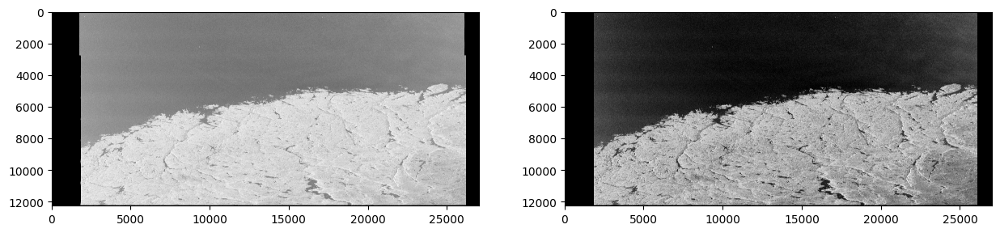

In [ ]:

import numpy as np
from scipy.ndimage import uniform_filter

def lee_filter(image, *args, **kwargs):
    """
    Apply Lee filter to a 2D image.

    Parameters:
    - image: 2D NumPy array (real-valued)
    - window_size: Integer, size of the filtering window

    Returns:
    - filtered_image: 2D NumPy array, the Lee-filtered image
    """
    window_size = 9
    # Calculate local mean using uniform filter
    local_mean = uniform_filter(image, size=window_size)

    # Calculate local variance
    local_variance = uniform_filter(image**2, size=window_size) - local_mean**2

    # Calculate Lee filter weights
    weights = local_variance / (local_variance + np.mean(local_variance))

    # Apply Lee filter
    filtered_image = local_mean + weights * (image - local_mean)

    return filtered_image

prepro_sarfish = np.clip(10 * np.log((lee_filter(np.abs(vh_img_sf)) + 0.1)**2), 20, 90)
prepro_snap = np.clip(10 * np.log10((lee_filter(np.abs(vh_img_snap)) + 1e-6)**2),-30,-10)

fig, (ax1,ax2) = plt.subplots( 1,2, figsize=(15,15))
ax1.imshow(prepro_sarfish, cmap='Greys_r')
ax2.imshow(prepro_snap, cmap='Greys_r')




In [ ]:
import pandas as pd


In [ ]:
targets = pd.read_csv('/mnt/sasa028/cvnn4sar/SARFish/SARFish_data/raw_data/SLC/detection/SLC_detection.csv')
targets = targets[(targets['SLC_product_identifier'] == prod_51) & (targets['swath_index'] == swath_index)]
ship = targets.iloc[10]

In [ ]:
left, right, top, bottom = int(ship['left']), int(ship['right']), int(ship['top']), int(ship['bottom'])


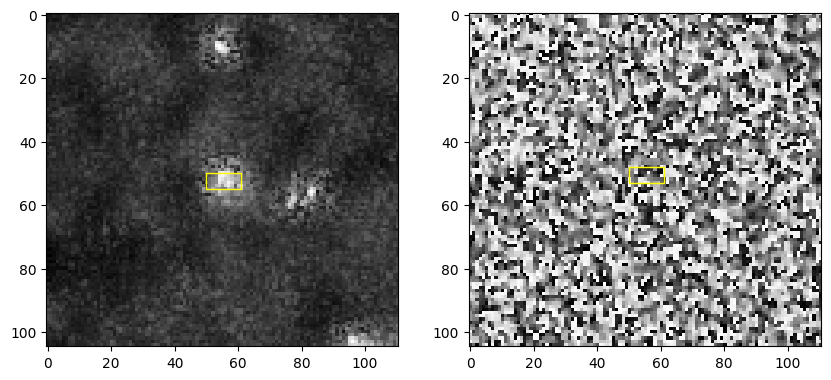

In [ ]:
from matplotlib.patches import Rectangle

rect1 = Rectangle((50, 50), right - left, top - bottom, facecolor='none', edgecolor = 'yellow')
rect2 = Rectangle((50, 48), right - left, top - bottom, facecolor='none', edgecolor = 'yellow')
fig, (ax1, ax2) = plt.subplots(1,2, figsize= (10,10))
ax1.imshow(prepro_sarfish[bottom - 50 : top + 50, left - 50 : right + 50], cmap='Greys_r')
ax1.add_patch(rect1)

ax2.imshow(np.angle(vv_img_snap)[bottom - 50: top + 50, left - 50 :right + 50], cmap='Greys_r')
ax2.add_patch(rect2)

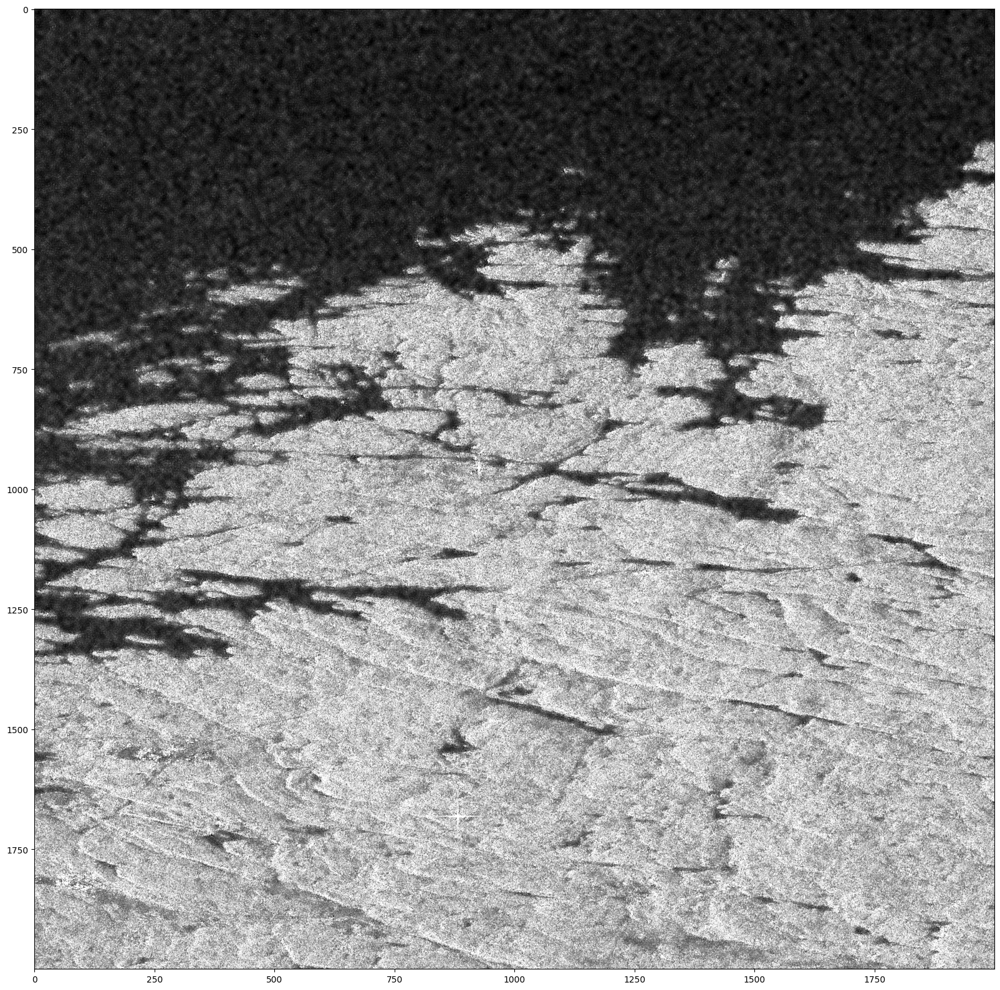

In [ ]:
fig, ax = plt.subplots(figsize=(30,20))
ax.imshow(prepro_snap[6000:8000, 6000:8000], cmap='Greys_r')

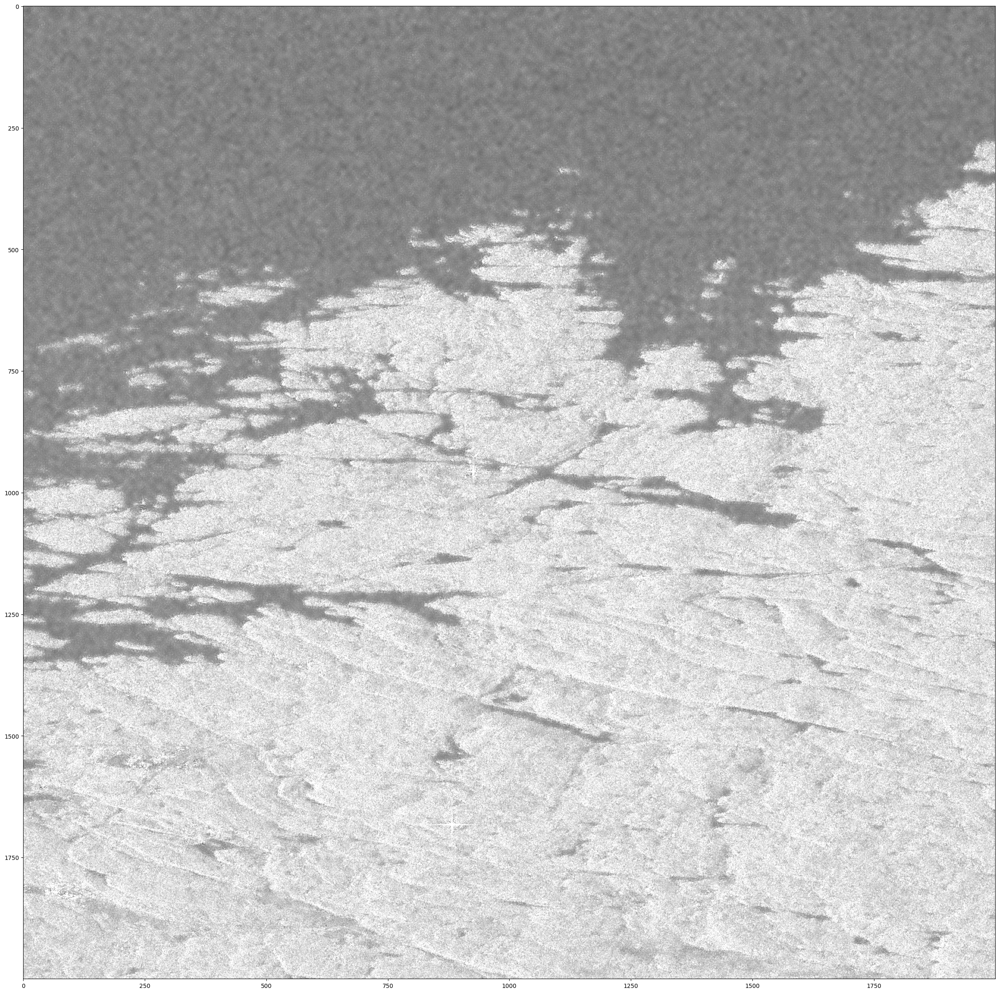

In [ ]:
fig, ax = plt.subplots(figsize=(30,30))
ax.imshow(prepro_sarfish[6000:8000, 6000:8000], cmap='Greys_r')

In [6]:
import numpy as np

array = np.random.randn(2,128,128)

array = np.stack((array[0]/500, array[1]/5000))
print(array)

[[[-7.77133932e-04 -1.49024347e-03  1.15677318e-03 ...  8.39625345e-04
    1.47321914e-03 -3.67121852e-04]
  [ 2.09335841e-03 -1.80501425e-03  1.00345604e-04 ...  9.30400165e-04
   -2.49972112e-03  9.61126991e-05]
  [-1.26671827e-03 -1.51032546e-04  8.60368358e-04 ... -4.06596172e-03
   -2.60577662e-04  7.23178222e-04]
  ...
  [ 1.71700780e-03 -2.63255741e-04 -3.97651733e-03 ...  2.82785109e-03
    1.54097301e-03  1.50905266e-03]
  [-3.12793901e-03 -1.58883620e-03  2.14956724e-03 ...  7.21726948e-04
   -2.08776235e-03 -1.86436204e-04]
  [-2.92304783e-03  3.49813218e-03 -9.26917415e-04 ... -1.17167194e-03
   -3.22032757e-03 -1.03679584e-03]]

 [[-2.11207200e-05 -4.65225762e-05 -6.39031094e-05 ... -2.15434416e-05
    1.88098757e-05 -1.90234425e-05]
  [ 1.11200465e-04 -4.04034587e-05  1.46857479e-04 ...  4.62502005e-07
    2.45014891e-04 -7.66580172e-05]
  [ 5.28077815e-05 -3.05002712e-05  3.95996498e-05 ...  2.46237282e-05
    2.19602113e-06  2.33221626e-04]
  ...
  [ 5.26643951e-04  2.1